In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/driving-video-with-object-tracking/mot_labels.csv
/kaggle/input/driving-video-with-object-tracking/mot_labels.parquet
/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/02506726-0e9b815e.mov
/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/01317a31-6ea7d85d.mov
/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/0153f03b-3b26c404.mov
/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/007c11bf-f6da335c.mov
/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/01461010-eeca4bf2.mov
/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/00f7eac8-5193d600.mov
/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/00ccf2e8-59a6bfc9.mov
/kaggle/input/driving-video-with-object-tracking/bdd100k

In [1]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [5]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

from glob import glob
import IPython.display as ipd
from tqdm import tqdm

import subprocess
plt.style.use('ggplot')

# ****Covert Video Types ( Mov --> MP4)****

In [26]:
input_file = '../input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/026c7465-309f6d33.mov'
subprocess.run(['ffmpeg',
                '-i',
                input_file,
                '-qscale',
                '0',
                '026c7465-309f6d33.mp4',
                '-loglevel',
                'quiet']
              )

ffmpeg: /opt/conda/lib/libncursesw.so.6: no version information available (required by /lib/x86_64-linux-gnu/libcaca.so.0)
ffmpeg: /opt/conda/lib/libncursesw.so.6: no version information available (required by /lib/x86_64-linux-gnu/libcaca.so.0)
File '026c7465-309f6d33.mp4' already exists. Overwrite ? [y/N] 

CompletedProcess(args=['ffmpeg', '-i', '../input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/026c7465-309f6d33.mov', '-qscale', '0', '026c7465-309f6d33.mp4', '-loglevel', 'quiet'], returncode=1)

In [27]:
#!rm 0000f77c-6257be58.mp4
#!rm 026c7465-309f6d33.mp4

In [28]:
!ls -l

total 24052
-rw-r--r-- 1 root root 10747952 Apr 26 09:46 0000f77c-6257be58.mp4
-rw-r--r-- 1 root root 13869733 Apr 26 09:47 026c7465-309f6d33.mp4
---------- 1 root root      263 Apr 26 09:21 __notebook_source__.ipynb


In [29]:
# Open the video and read the metadata

cap = cv2.VideoCapture('026c7465-309f6d33.mp4')

In [30]:
#Get total number of frames in video

cap.get(cv2.cv2.CAP_PROP_FRAME_COUNT)

2398.0

In [31]:
# Get Video height and width

height = cap.get(cv2.cv2.CAP_PROP_FRAME_HEIGHT)
width = cap.get(cv2.cv2.CAP_PROP_FRAME_WIDTH)
print(f'Height {height}, Width {width}')

Height 720.0, Width 1280.0


In [32]:
# Get frames per second
fps = cap.get(cv2.cv2.CAP_PROP_FPS)
print(f'FPS : {fps:0.2f}')

FPS : 59.94


In [33]:
cap.release()

# **Pulling in images from Video**

In [34]:
cap = cv2.VideoCapture('026c7465-309f6d33.mp4')
ret, img = cap.read()
print(f'Returned {ret} and img of shape {img.shape}')

Returned True and img of shape (720, 1280, 3)


In [35]:
## Helper function for plotting opencv images in notebook
def display_cv2_img(img, figsize=(10, 10)):
    img_ = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(img_)
    ax.axis("off")

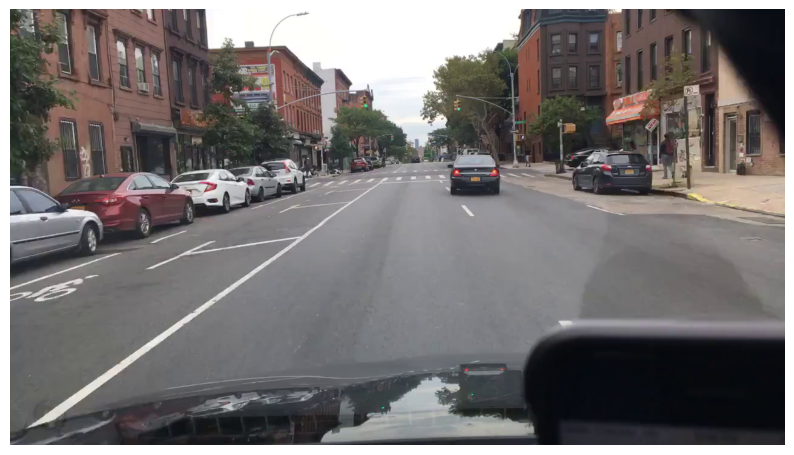

In [36]:
display_cv2_img(img)

In [37]:
cap.release()

# Display multiple frames from the video

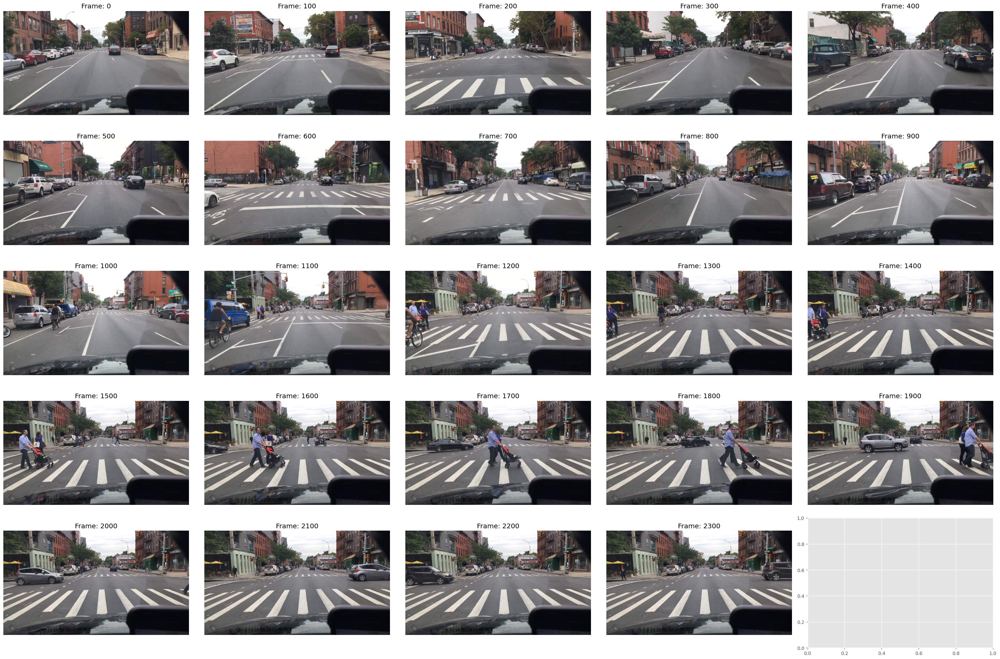

In [40]:
fig, axs = plt.subplots(5, 5, figsize=(30, 20))
axs = axs.flatten()

cap = cv2.VideoCapture("026c7465-309f6d33.mp4")
n_frames = int(cap.get(cv2.cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame % 100 == 0:
        axs[img_idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[img_idx].set_title(f'Frame: {frame}')
        axs[img_idx].axis('off')
        img_idx += 1

plt.tight_layout()
plt.show()
cap.release()

# Add Annotations to Video Images

In [78]:
labels = pd.read_csv('../input/driving-video-with-object-tracking/mot_labels.csv',
                     low_memory=False)
video_labels = (
    labels.query('videoName == "026c7465-309f6d33"').reset_index(drop=True).copy()
)
video_labels["video_frame"] = (video_labels["frameIndex"] * 11.9).round().astype("int")

In [79]:
video_labels["category"].value_counts()

car              3030
pedestrian        847
bicycle           381
rider             320
truck             194
other vehicle     115
bus               109
other person       74
motorcycle         67
trailer            34
Name: category, dtype: int64

In [80]:
# Pull frame 1035

cap = cv2.VideoCapture("026c7465-309f6d33.mp4")
n_frames = int(cap.get(cv2.cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame == 1035:
        break
cap.release()

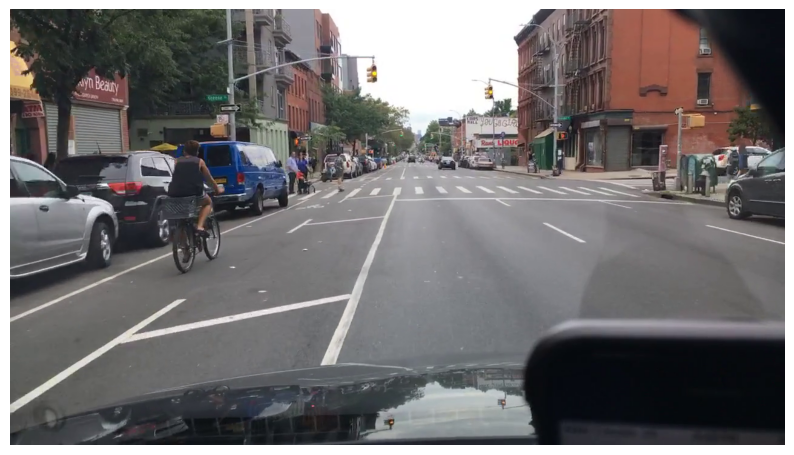

In [81]:
display_cv2_img(img)

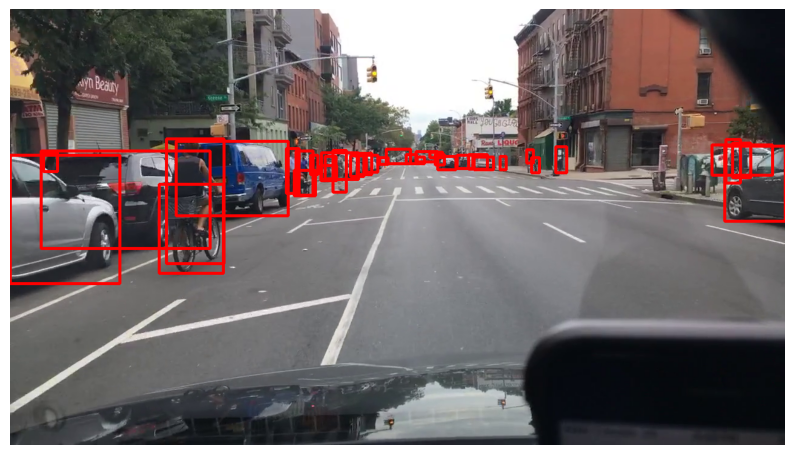

In [82]:
img_example = img.copy()
frame_labels = video_labels.query('video_frame == 1035')
for i, d in frame_labels.iterrows():
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
    cv2.rectangle(img_example, pt1, pt2, (0, 0, 255), 3)

display_cv2_img(img_example)

# Displaying Colored by Category

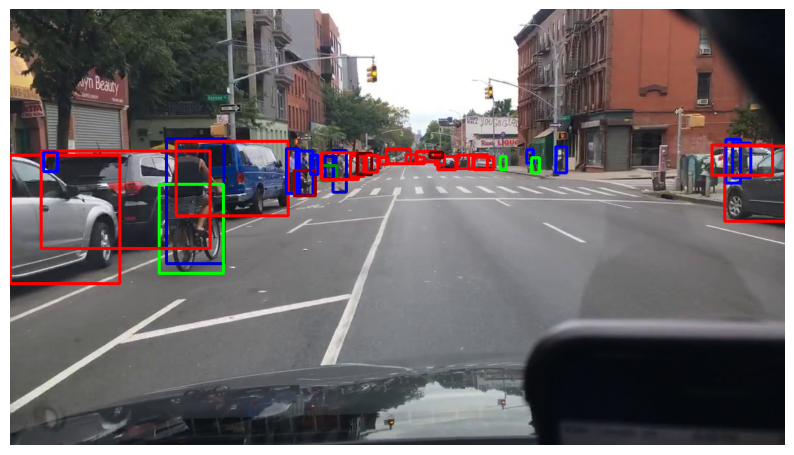

In [83]:
color_map = {
    "car": (0, 0, 255),
    "truck": (0, 0, 100),
    "pedestrian": (255, 0, 0),
    "other vehicle": (0, 0, 150),
    "rider": (200, 0, 0),
    "bicycle": (0, 255, 0),
    "other person": (200, 0, 0),
    "trailer": (0, 150, 150),
    "motorcycle": (0, 150, 0),
    "bus": (0, 0, 100),
}

img_example = img.copy()
frame_labels = video_labels.query('video_frame == 1035')
for i, d in frame_labels.iterrows():
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
    color = color_map[d['category']]
    cv2.rectangle(img_example, pt1, pt2, color, 3)

display_cv2_img(img_example)

# Adding text image lables

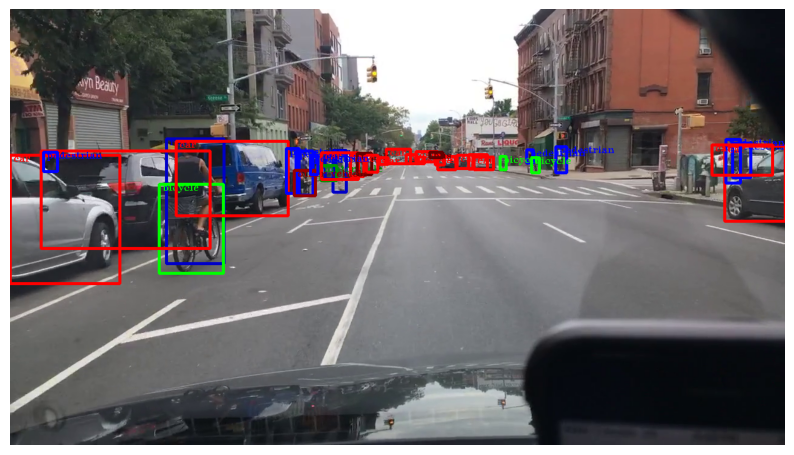

In [84]:
frame_labels = video_labels.query("video_frame == @frame")
font = cv2.FONT_HERSHEY_TRIPLEX
img_example = img.copy()
for i, d in frame_labels.iterrows():
    pt1 = int(d["box2d.x1"]), int(d["box2d.y1"])
    pt2 = int(d["box2d.x2"]), int(d["box2d.y2"])
    color = color_map[d["category"]]
    img_example = cv2.rectangle(img_example, pt1, pt2, color, 3)
    pt_text = int(d["box2d.x1"]) + 5, int(d["box2d.y1"] + 10)
    img_example = cv2.putText(img_example, d["category"], pt_text, font, 0.5, color)
display_cv2_img(img_example)
cap.release()

# Label and output annotated video

In [87]:
def add_annotations(img,frame, video_labels):
    max_frame = video_labels.query("video_frame <= @frame")["video_frame"].max()
    rame_labels = video_labels.query('video_frame == @max_frame')
    for i, d in frame_labels.iterrows():
        pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
        pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
        color = color_map[d["category"]]
        img = cv2.rectangle(img,pt1,pt2,color,3)
    return img

In [88]:
VIDEO_CODEC = "mp4v"
fps = 59.94
width = 1280
height = 720
out = cv2.VideoWriter("out_test.mp4",
                cv2.VideoWriter_fourcc(*VIDEO_CODEC),
                fps,
                (width, height))

cap = cv2.VideoCapture("026c7465-309f6d33.mp4")
n_frames = int(cap.get(cv2.cv2.CAP_PROP_FRAME_COUNT))

for frame in tqdm(range(n_frames), total=n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    img = add_annotations(img, frame,video_labels)
    out.write(img)
out.release()
cap.release()

100%|██████████| 2398/2398 [00:38<00:00, 62.52it/s]


In [100]:
!ls -GFlash -color

total 123M
 29M -rw-r--r-- 1 root  29M Apr 26 11:41 out_test_compressed.mp4
 71M -rw-r--r-- 1 root  71M Apr 26 11:26 out_test.mp4
4.0K ---------- 1 root  263 Apr 26 09:21 __notebook_source__.ipynb
 14M -rw-r--r-- 1 root  14M Apr 26 09:47 026c7465-309f6d33.mp4
 11M -rw-r--r-- 1 root  11M Apr 26 09:46 0000f77c-6257be58.mp4
4.0K drwxr-xr-x 2 root 4.0K Apr 26 09:22 .virtual_documents/
4.0K drwxr-xr-x 5 root 4.0K Apr 26 09:21 ../
4.0K drwxr-xr-x 3 root 4.0K Apr 26 11:41 ./


In [104]:
!rm out_test_compressed.mp4

In [105]:
tmp_output_path = "out_test.mp4"
output_path = "out_test_compressed.mp4"
subprocess.run(
    [
        "ffmpeg",
        "-i",
        tmp_output_path,
        "-crf",
        "18",
        "-preset",
        "veryfast",
        "-vcodec",
        "libx264",
        output_path,
        '-loglevel',
        'quiet'
    ]
)

ffmpeg: /opt/conda/lib/libncursesw.so.6: no version information available (required by /lib/x86_64-linux-gnu/libcaca.so.0)
ffmpeg: /opt/conda/lib/libncursesw.so.6: no version information available (required by /lib/x86_64-linux-gnu/libcaca.so.0)


CompletedProcess(args=['ffmpeg', '-i', 'out_test.mp4', '-crf', '18', '-preset', 'veryfast', '-vcodec', 'libx264', 'out_test_compressed.mp4', '-loglevel', 'quiet'], returncode=0)

In [110]:
ipd.Video("out_test_compressed.mp4",width=600)